# Finding Similar Players With Data Science 

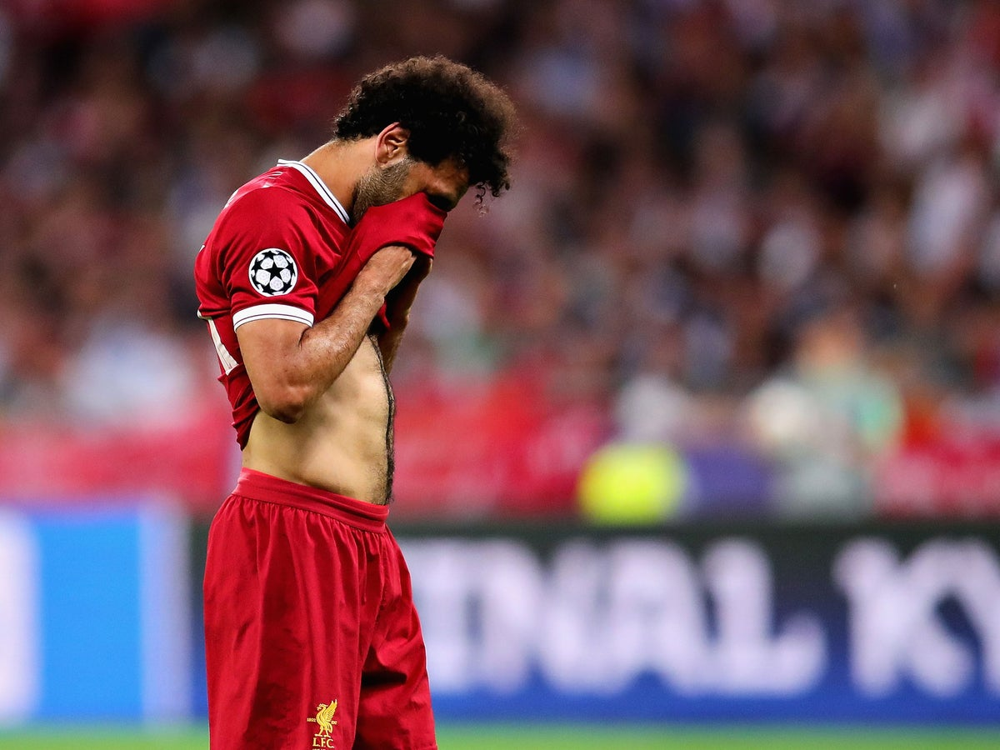

Mohamed Salah is one of the best players in the world and arguably the best player right now on current form. Liverpool have been utilising his skills and abilities to compete in winning all titles. But Liverpoolf faces a schock where they are faced with the african cup of nations that occurs in January and February, which means that 3 of Liverpool's african players have to leave the club to join their national teams, including Salah.

January is one of the most crucial months in the season as Liverpool will play 6 games in 3 different competitions, including a game against their rivals Chelsea in the premier league, a league cup semi final against Arsenal and a knockout game in the FA Cup.

Salah leaves Liverpool as their top scorer with 23 goals and the top assister with 10 assists which means that losing him in such games will make it difficult for Liverpool, especially that losing one of the games mentioned above means that the team is out of the competition for the rest of the season.

I want to use data science and machine learning which has become common in football to analyse players statistics to find the perfect fit for Liverpool to replace Salah. I'm going to use the FIFA 22 videogame dataset. The Videogame dataset has all teams and players with in depth rating and attributes that are calculated accurately from real life. This encourages exploration and real life football anlaysis that can be very close to accuracy. I want to use the dataset and data science techniques like clustering, and Two-classclassification as regression to find who can Liverpool sign to replace Salah.

## Load Libraries 

In [1432]:
#import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import os
from sklearn.neighbors import NearestNeighbors

pd.set_option('display.max_columns', None)

import warnings
warnings.filterwarnings('ignore')

In [1295]:
pip install plotly==5.5.0

Note: you may need to restart the kernel to use updated packages.


In [1296]:
from plotly.offline import init_notebook_mode, iplot, plot
from plotly.subplots import make_subplots
import plotly.express as px
import plotly as py
init_notebook_mode(connected=True)
import plotly.graph_objs as go

In [1297]:
pd.set_option('precision', 0)

## Load file and dataset 

In [1337]:
DataFrame = pd.read_csv('FIFA22_official_data.csv.zip', encoding = "UTF-8")
DataFrame.head()

,ID,Name,Age,Photo,Nationality,Flag,Overall,Potential,Club,Club Logo,Value,Wage,Special,Preferred Foot,International Reputation,Weak Foot,Skill Moves,Work Rate,Body Type,Real Face,Position,Jersey Number,Joined,Loaned From,Contract Valid Until,Height,Weight,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Best Position,Best Overall Rating,Release Clause,DefensiveAwareness
0,212198,Bruno Fernandes,26,https://cdn.sofifa.com/players/212/198/22_60.png,Portugal,https://cdn.sofifa.com/flags/pt.png,88,89,Manchester United,https://cdn.sofifa.com/teams/11/30.png,€107.5M,€250K,2341,Right,3,3,4,High/ High,Unique,Yes,"<span class=""pos pos18"">CAM",18,"Jan 30, 2020",NaN,2025,179cm,69kg,87,83,64,91,87,83,87,87,88,87,77,73,80,91,79,89,73,91,70,89,78,66,87,90,91,87,NaN,73,65,12,14,15,8,14,CAM,88,€206.9M,72
1,209658,L. Goretzka,26,https://cdn.sofifa.com/players/209/658/22_60.png,Germany,https://cdn.sofifa.com/flags/de.png,87,88,FC Bayern München,https://cdn.sofifa.com/teams/21/30.png,€93M,€140K,2314,Right,4,4,3,High/ Medium,Unique,Yes,"<span class=""pos pos11"">LDM",8,"Jul 1, 2018",NaN,2026,189cm,82kg,75,82,86,86,69,84,76,75,84,87,78,83,76,88,71,85,79,88,88,86,81,86,85,84,60,82,NaN,85,77,13,8,15,11,9,CM,87,€160.4M,74
2,176580,L. Suárez,34,https://cdn.sofifa.com/players/176/580/22_60.png,Uruguay,https://cdn.sofifa.com/flags/uy.png,88,88,Atlético de Madrid,https://cdn.sofifa.com/teams/240/30.png,€44.5M,€135K,2307,Right,5,4,3,High/ Medium,Unique,Yes,"<span class=""pos pos24"">RS",9,"Sep 25, 2020",NaN,2022,182cm,83kg,80,93,84,83,90,83,86,82,77,86,76,69,75,92,78,89,69,78,85,88,87,41,91,84,83,87,NaN,45,38,27,25,31,33,37,ST,88,€91.2M,42
3,192985,K. De Bruyne,30,https://cdn.sofifa.com/players/192/985/22_60.png,Belgium,https://cdn.sofifa.com/flags/be.png,91,91,Manchester City,https://cdn.sofifa.com/teams/10/30.png,€125.5M,€350K,2304,Right,4,5,4,High/ High,Unique,Yes,"<span class=""pos pos13"">RCM",17,"Aug 30, 2015",NaN,2025,181cm,70kg,94,82,55,94,82,88,85,83,93,91,76,76,79,91,78,91,63,89,74,91,76,66,88,94,83,89,NaN,65,53,15,13,5,10,13,CM,91,€232.2M,68
4,224334,M. Acuña,29,https://cdn.sofifa.com/players/224/334/22_60.png,Argentina,https://cdn.sofifa.com/flags/ar.png,84,84,Sevilla FC,https://cdn.sofifa.com/teams/481/30.png,€37M,€45K,2292,Left,2,3,4,High/ High,Stocky (170-185),No,"<span class=""pos pos7"">LB",19,"Sep 14, 2020",NaN,2024,172cm,69kg,87,66,58,82,68,87,88,75,78,88,77,76,83,83,90,82,63,90,80,81,84,79,81,82,76,87,NaN,84,82,8,14,13,13,14,LB,84,€77.7M,80


This dataset provides the complete statistics available at the player level in the FIFA 20 game. This dataset was scraped from the sofifa.com and is very clean in terms of the structure and expected data types. We will just transform the data to the format we need, and keep only selected features which might be useful in our analysis.
Our data has a lot of features that are actually explained or have the same information captured in them as other variables.

Some key observations in the dataset:

potential and overall are highly correlated. 
potential is basically an integer greater than or equal to overall.
overall is a computation based on all the other skill ratings of a player such as shooting, passing, etc.
Unless a player plays at a Goalkeeper position (GW), all his goalkeeper statistics are NaNs.
The columns ls, st, rs, lw etc. are playing positions in the game and the data in these columns is basically the max potential of a player if he were to play in that position. We will assume a player only plays in his preferred position and we will drop all these columns.
For our analysis, we will drop all columns unnecessary for our analysis as and when we reach that conclusion. For now, all descriptive columns like sofifa_id, player_url, nationality etc. will be dropped.
player_positions are the preferred positions of the player. We will keep only the first playing position for our analysis.

In [1338]:
DataFrame.shape

(16710, 65)

The Dataset has 16710 rows which represents the number of players and 65 columns which represents the number of variables. This means that this dataset is huge which will need alot of analysis and cleaning. So to start this process I will find the types of each column using dtypes function

In [1339]:
pd.DataFrame(data.dtypes).T

,ID,Age,Overall,Potential,Value,WageK,Preferred Foot,Weak Foot,Skill Moves,Contract,Height,Weight,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,Best Overall Rating,DefensiveAwareness
0,int64,int64,int64,int64,int64,int64,object,float64,float64,float64,object,object,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64


The columns vary from objects to integers to floats, it is understandable that variables like names and clubs will be objects but numerical values will be needed to all transformed to floats for analysing and finding similarity after deciding on the important ones.Now I'm going to check the unique values of each column and null values to check the completion of the dataset. 

In [1340]:
DataFrame.nunique()

ID                     16710
Name                   16089
Age                       30
Photo                  16710
Nationality              168
                       ...  
GKReflexes                74
Best Position             15
Best Overall Rating       51
Release Clause          1170
DefensiveAwareness        90
Length: 65, dtype: int64

In [1341]:
DataFrame.isnull().sum()

ID                        0
Name                      0
Age                       0
Photo                     0
Nationality               0
                       ... 
GKReflexes                0
Best Position             0
Best Overall Rating       0
Release Clause         1749
DefensiveAwareness      892
Length: 65, dtype: int64

Release Clause has a lot of unique values and at the same time alot of null values which means that this variable is unreliable to continue with and there is another column of players market values, it can be depended on to determine tranfer fees. Lack of uniqness and big null values are also shown in columns like goalkeeping and defending awarness, which will be further analysed as goalkeeprs are expected to have seperate variables. Final summary of the dataset will be found now using info and describe functions to find detailes info and statistics about each column.

In [1342]:
DataFrame.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16710 entries, 0 to 16709
Data columns (total 65 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   ID                        16710 non-null  int64  
 1   Name                      16710 non-null  object 
 2   Age                       16710 non-null  int64  
 3   Photo                     16710 non-null  object 
 4   Nationality               16710 non-null  object 
 5   Flag                      16710 non-null  object 
 6   Overall                   16710 non-null  int64  
 7   Potential                 16710 non-null  int64  
 8   Club                      16446 non-null  object 
 9   Club Logo                 16710 non-null  object 
 10  Value                     16710 non-null  object 
 11  Wage                      16710 non-null  object 
 12  Special                   16710 non-null  int64  
 13  Preferred Foot            16710 non-null  object 
 14  Intern

In [1343]:
DataFrame.describe()

,ID,Age,Overall,Potential,Special,International Reputation,Weak Foot,Skill Moves,Jersey Number,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Best Overall Rating,DefensiveAwareness
count,16710,16710,16710,16710,16710,2e+04,2e+04,2e+04,16684,16710,16710,16710,16710,16673,16710,16673,16710,16710,16710,16710,16710,16673,16710,16673,16710,16673,16710,16710,16710,16710,16702,16702,16673,16710,16459,892,16710,16673,16710,16710,16710,16710,16710,16710,15818
mean,220560,26,68,73,1652,1e+00,3e+00,2e+00,20,52,49,54,61,46,59,51,45,55,61,66,66,65,64,65,61,66,64,66,50,58,48,53,56,51,61,48,49,47,16,16,15,16,16,69,48
std,38497,5,6,6,257,5e-01,7e-01,8e-01,18,18,19,17,14,18,18,18,18,14,16,15,15,15,9,14,13,12,16,13,19,17,21,19,13,16,11,22,21,21,17,16,16,17,17,6,20
min,27,16,28,38,571,1e+00,1e+00,1e+00,1,7,3,5,8,4,5,6,4,9,8,13,15,18,28,19,12,22,13,18,4,11,4,3,10,7,12,4,3,6,1,1,1,1,1,36,3
25%,203891,22,63,69,1525,1e+00,3e+00,2e+00,8,42,34,46,57,33,54,39,33,47,58,58,59,57,58,57,52,59,57,59,37,47,28,44,48,41,55,27,29,26,8,8,8,8,8,65,30
50%,229253,25,68,72,1687,1e+00,3e+00,2e+00,17,57,53,57,64,48,64,53,44,58,65,68,68,68,64,67,62,67,67,68,55,61,55,58,58,52,62,53,57,54,11,11,11,11,11,68,54
75%,245369,29,72,76,1826,1e+00,3e+00,3e+00,27,65,64,66,70,59,70,64,59,66,71,76,76,75,69,75,70,74,75,75,65,71,65,67,66,62,69,67,67,65,14,14,14,14,14,73,65
max,264704,54,93,95,2341,5e+00,5e+00,5e+00,99,94,95,93,94,90,96,94,94,93,96,97,97,96,96,96,95,95,97,97,94,95,95,96,95,96,96,94,93,95,91,92,93,93,90,93,93


## Clean Data

As observed from the data exploration, there are alot of variables that are either objects like 'Loaned from' and 'Joined, or have alot of null Values like Release Clause, or are of no use when comparing players like photos and flags for example. So these will be the first variables to be dropped from the dataset.

In [1344]:
DataFrame.drop(['Photo','Flag','Club Logo','Position','Special','Work Rate','Real Face','Release Clause','International Reputation','Body Type','Jersey Number','Joined','Loaned From'],axis=1, inplace = True )

Now from the data types there are a few important numerical variables that are classified as objects, so to organize and clean these variables I'm going to explore them further and modify them. Starting with Value, I'm going to anlayse the values by finding all unique ones.

In [1345]:
DataFrame['Value'].unique()

array(['€107.5M', '€93M', '€44.5M', '€125.5M', '€37M', '€108M', '€28.5M',
       '€40.5M', '€35M', '€53M', '€32M', '€88M', '€24M', '€35.5M', '€50M',
       '€63.5M', '€27.5M', '€119.5M', '€48M', '€19M', '€52.5M', '€71.5M',
       '€42.5M', '€114M', '€66M', '€12M', '€79.5M', '€78M', '€33M',
       '€39.5M', '€47M', '€101M', '€46M', '€45M', '€0', '€34.5M',
       '€129.5M', '€4.8M', '€65M', '€29.5M', '€51.5M', '€13M', '€22M',
       '€49.5M', '€26.5M', '€39M', '€36M', '€38M', '€16.5M', '€69.5M',
       '€57M', '€62.5M', '€129M', '€36.5M', '€3.2M', '€54M', '€19.5M',
       '€100M', '€25M', '€30M', '€24.5M', '€58M', '€28M', '€194M',
       '€1.2M', '€4.3M', '€22.5M', '€30.5M', '€53.5M', '€10.5M', '€73.5M',
       '€83.5M', '€15M', '€16M', '€2.3M', '€21M', '€11M', '€20.5M',
       '€1.4M', '€18.5M', '€75M', '€43.5M', '€31.5M', '€9.5M', '€77.5M',
       '€104M', '€38.5M', '€7M', '€21.5M', '€4.6M', '€33.5M', '€14M',
       '€14.5M', '€17M', '€11.5M', '€17.5M', '€2.9M', '€4M', '€4.9M',
       

Player Values include £ sign and M and K so they need to be transfered to numeric values to get rid of them .In this case I would have used the string slice function to elimante the currency signs but in this column we have values in millions and thousands so slicing won't differenciate the value difference between thousands and millions. So I will replace the currency strings with space and replace M and K with the corrosponding number of zeros to represent the whole number.

In [1346]:
DataFrame['Value'] = DataFrame['Value'].str.replace('€', '')
DataFrame["Value"]= DataFrame["Value"].replace({"K":"*1e3", "M":"*1e6"}, regex= True).map(pd.eval).astype(int)

Now do the same for Wages:

In [1347]:
DataFrame['Wage'].unique()

array(['€250K', '€140K', '€135K', '€350K', '€45K', '€160K', '€61K',
       '€115K', '€72K', '€220K', '€190K', '€95K', '€195K', '€47K',
       '€120K', '€130K', '€210K', '€110K', '€90K', '€185K', '€52K',
       '€150K', '€100K', '€105K', '€310K', '€320K', '€38K', '€46K',
       '€200K', '€270K', '€77K', '€30K', '€240K', '€60K', '€155K', '€68K',
       '€180K', '€66K', '€29K', '€34K', '€65K', '€51K', '€170K', '€42K',
       '€125K', '€18K', '€33K', '€74K', '€17K', '€230K', '€58K', '€35K',
       '€24K', '€79K', '€81K', '€20K', '€55K', '€39K', '€0', '€89K',
       '€22K', '€64K', '€78K', '€36K', '€165K', '€175K', '€11K', '€1K',
       '€49K', '€41K', '€63K', '€57K', '€71K', '€10K', '€32K', '€50K',
       '€19K', '€82K', '€145K', '€76K', '€80K', '€53K', '€27K', '€69K',
       '€70K', '€87K', '€43K', '€15K', '€28K', '€14K', '€83K', '€88K',
       '€26K', '€21K', '€86K', '€73K', '€59K', '€23K', '€56K', '€2K',
       '€48K', '€290K', '€12K', '€8K', '€13K', '€54K', '€25K', '€31K',
       '€40K

Wages unlike Value are all in thousands so it would be easier to slice to get rid of the signs and transform it to an integer.

In [1348]:
DataFrame['Wage'] = DataFrame['Wage'].str.slice(1,-1)
DataFrame['Wage'] = np.where(DataFrame['Wage'] =='', '0', DataFrame['Wage'])
DataFrame['Wage'] = DataFrame['Wage'].astype(int)

Another object that needs to be a numerical value as it is important to know about the player is the 'contract valid until'. The long name is limiting the exploration I can do with this column so I'm going to rename it along with best position and wages as it is now represented in thousands.

In [1349]:
rename_dict = {'Best Position':'Position','Wage':'WageK','Contract Valid Until':'Contract'}

DataFrame.rename(columns=rename_dict, inplace=True)
rename_dict = {'Best Position':'Position',  
               'Wage': 'WageK',  # I sliced the wage variable so now it represented in thousands 
               'Contract Valid Until':'Contract'}

DataFrame.rename(columns=rename_dict, inplace=True)

In [1350]:
DataFrame['Contract'].unique()

array(['2025', '2026', '2022', '2024', 'Jun 30, 2022', '2027', '2023',
       '2013', '2019', '2021', '2012', '2020', nan, '2017', '2018',
       '2016', 'Jun 30, 2021', '2014', 'Dec 31, 2021', '2015',
       'Jun 30, 2020', 'Jun 1, 2022', '2011', '2028', 'Jun 30, 2018',
       'Jun 30, 2017', 'May 31, 2022', 'May 31, 2018', 'Dec 31, 2020',
       'Jun 30, 2019', 'Jun 30, 2014', 'Jun 30, 2023', '2031',
       'Dec 31, 2022', 'Jan 1, 2022', 'Dec 20, 2022', 'Jan 31, 2022',
       'Jan 3, 2022', 'May 31, 2019', 'Nov 27, 2021', 'Dec 1, 2021',
       'May 31, 2020', 'Dec 31, 2019', 'Jul 15, 2016', 'Nov 30, 2021',
       '2007', 'May 31, 2021', 'Jun 1, 2016', '2009', '2008',
       'Nov 30, 2017', 'Jan 4, 2021', '2010', 'Sep 6, 2022',
       'Jan 9, 2022', '2006', 'Jun 1, 2021'], dtype=object)

The conract column includes months and null values so I'm going to repeat same process with it by filling null values, slicing the string and transfroming into an integer.

In [1351]:
DataFrame['Contract'] = DataFrame['Contract'].fillna('0')
DataFrame['Contract']= [np.nan if 'X' in a else int(a) for a in DataFrame['Contract'].str.slice(-4)]
DataFrame['Contract'] = DataFrame['Contract'].astype(int) 

From the unique values of the contract column it is clear that for an unkown reason there are contracts with previous years. The players include managers and former players as icons that is why these values might be visible but I need to get rid of them for my analysis as we will be finding a current player with a running contract so I'm going to drop all contracts that ran before 2022.

In [1352]:
DataFrame = DataFrame.drop(DataFrame[DataFrame.Contract < 2022].index)

While some non-numerical objects like player's foot which is important to know later, it is best to use the factorize function to encode it as enumerated variable:

In [1353]:
DataFrame['Foot'] = pd.factorize(DataFrame['Preferred Foot'])[0]

## Explortatory Data Analysis

Now that some cleaning has been done, I will further explore the dataset right now, first by finding the distribution of overall ratings of players. Overall determines the overall quality of the player which is crucial to the goal of this project. So below is a histogram using seaborn to visualise overall distribution. 

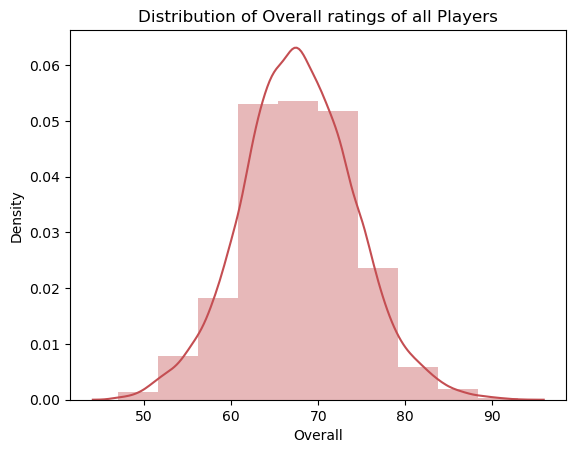

In [1354]:
plt.style.use('default')
sns.distplot(DataFrame['Overall'], bins=10, color='r')
plt.title("Distribution of Overall ratings of all Players")
plt.savefig("Distribution.png")
plt.show()

The histogram shows that players with overall higher than 80 are a very small percentage of the datastet, this will make it easy to find the player similar to Salah as the options will be limited. To drop and further clean the dataset, I will plot the correlation heatmap of the dataste to find the correlation between all attributes to help better feature engineering and choosing the attributes that I will search for in a player.  

<AxesSubplot:>

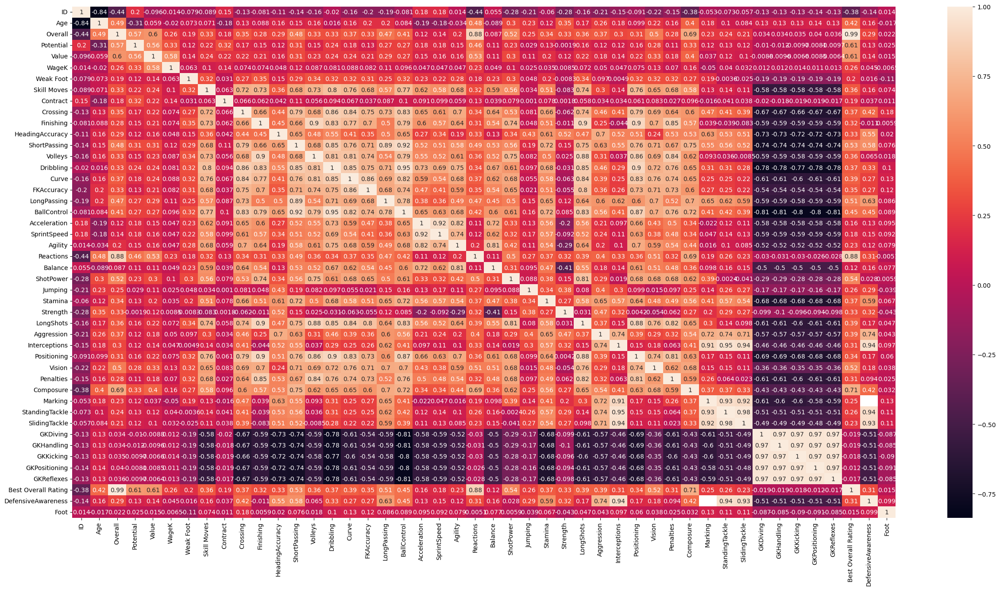

In [1355]:
plt.figure(figsize=(30, 15))
sns.heatmap(DataFrame.corr(), annot=True)

As observed above, there plenty of highly correlated variables, but I'm going to focus on the unusual ones. There is very high correlation of 0.88 between Reactions and Overall, which means the better the reactions the better overall ability of the player, so I will put in to consideration this when comparing playersto Salah. Also positioning and finishing have a correlation of 0.9, this can be interpreted that players that I will search for need to be intelligent off the ball along with the ball abilities.   

Very high correlation is also observed in the white squares close to each other which represents the very high correlation of goalkeeper related features. Goalkeepers are a separate group and none of the main attributes apply to them and neither their attributes are applied to the rest of the players as predicted before. So I will drop all goalkeepers and their attributes from the dataset.

In [1356]:
goalkeeper_features = ['GKHandling','GKReflexes','GKPositioning','GKDiving','GKKicking']
DataFrame = DataFrame.drop(goalkeeper_features, axis = 1)

In [1357]:
DataFrame = DataFrame[DataFrame.Position !='GK']

## Group Players by position

Now that I already got rid of a position, I will group each positions under defenders, midfielders and attackers for better classification and results. First I will find the unique positions:

In [1358]:
DataFrame['Position'].unique()

array(['CAM', 'CM', 'ST', 'LB', 'CDM', 'CB', 'RB', 'LM', 'RW', 'LW', 'CF',
       'LWB', 'RM', 'RWB'], dtype=object)

In [1360]:
# cluster each postion into the position they belong
forward = ["ST", "LW", "RW", "CF","RM","LM"]
midfielder = ["CM","CDM","CAM"]
defender = ["CB", "LWB", "RWB", "LB", "RB"]

Now I will assign a value to each position to replace in the dataset for smoother numerical analysis and comparison.

In [1361]:
DataFrame.loc[DataFrame["Position"].isin(defender), "Position"] = 1

DataFrame.loc[DataFrame["Position"].isin(midfielder), "Position"] = 2

DataFrame.loc[DataFrame["Position"].isin(forward), "Position"] = 3

## Finding Player like Salah in Liverpool

Before carrying on with the search of similar players, I will check the main attributes of Salah which is know like speed and dribbling and important ones I found in the correlation like Positioning and Reactions. Then I will search for players similar to him in Liverpool first before searching outside of the club.

In [1362]:
def Name(x):
    return DataFrame[DataFrame['Name'] == x][['Name','Position','Overall', 'Finishing', 'Penalties', 'SprintSpeed', 'Dribbling', 'ShortPassing','BallControl','Agility', 'Reactions', 'Positioning']]

Name ('M. Salah')

,Name,Position,Overall,Finishing,Penalties,SprintSpeed,Dribbling,ShortPassing,BallControl,Agility,Reactions,Positioning
34,M. Salah,3,89,91,86,91,90,84,89,91,92,91


As Salah is a forward I'm going to find all forwards in Liverpool using the loc function, and find if there are suitable replacements for him in the club already or I will continue with my search.

In [1363]:
DataFrame.loc[(DataFrame['Club'] == 'Liverpool') & (DataFrame['Position'] == 3)]

,ID,Name,Age,Nationality,Overall,Potential,Club,Value,WageK,Preferred Foot,Weak Foot,Skill Moves,Contract,Height,Weight,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,Position,Best Overall Rating,DefensiveAwareness,Foot
34,209331,M. Salah,29,Egypt,89,89,Liverpool,101000000,270,Left,3,4,2023,175cm,71kg,79,91,59,84,81,90,83,69,75,89,89,91,91,92,91,82,69,85,75,84,63,55,91,83,86,90,NaN,43,41,3,89,38,1
55,208722,S. Mané,29,Senegal,89,89,Liverpool,101000000,270,Right,4,4,2023,175cm,69kg,78,86,84,84,75,90,77,64,71,88,93,90,93,91,88,83,87,85,72,80,75,35,90,84,71,84,NaN,42,38,3,89,42,0
68,201942,Roberto Firmino,29,Brazil,85,85,Liverpool,54000000,185,Right,4,5,2023,181cm,76kg,73,78,78,84,83,89,81,65,76,90,77,77,85,86,86,79,81,87,74,76,75,58,82,83,72,88,NaN,64,42,3,85,55,0
119,224458,Diogo Jota,24,Portugal,82,87,Liverpool,46000000,120,Right,5,4,2025,178cm,73kg,71,84,77,75,78,85,77,58,71,85,88,81,87,84,86,84,76,81,71,75,85,56,85,75,63,83,NaN,57,45,3,84,54,0
2100,226627,T. Minamino,26,Japan,75,76,Liverpool,6500000,84,Right,4,3,2024,174cm,67kg,66,75,50,71,70,81,73,69,63,78,83,75,89,71,86,71,76,76,55,73,61,49,70,70,72,79,NaN,30,26,3,75,32,0
3694,213135,D. Origi,26,Belgium,76,79,Liverpool,10000000,88,Right,4,4,2024,189cm,90kg,69,76,74,73,70,76,54,40,59,77,73,84,71,76,64,80,76,70,77,70,69,28,77,69,65,77,NaN,24,18,3,78,16,0


From the table above, Liverpool have 6 forwards. Usually Liverpool start with 3. Along with Salah, as seen S. Mane is also Senegalese which means he will be going to the african cup with Salah. Which means there are only 2 forwared players that have an overall of more than 80, who are Firmino and Diogo Jota. As mentioned before the overall is an indication of players abilities all around, so the last 2 players, Origi and Minamino their overall indicated that they on a very far level from Salah to replace him, but before taking the decison, I will compare them to Salah to check for any special attributes that allow them to be Salah's replacement.

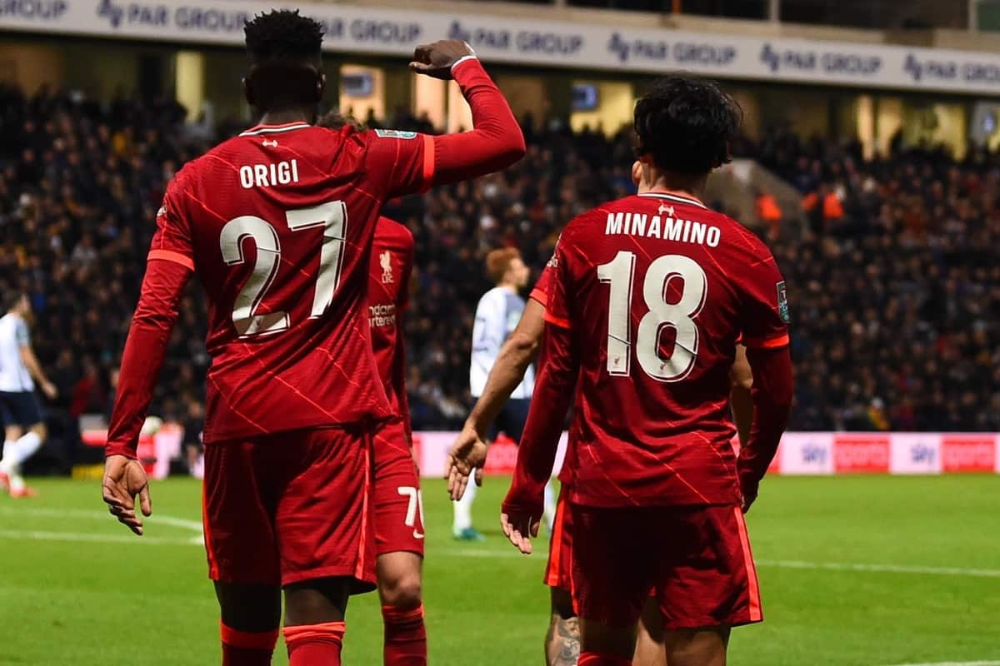

First, I'm going to use plotly to create an interactive table comparing Salah's main attributes found before ratings with Origi and Miamino highliting who has higher rating in each variable.

In [1364]:
# Set the table of replacements by adding the name of players and the attributes to compare 

replacement =  DataFrame[DataFrame.Name.isin(['M. Salah', 'T. Minamino','D. Origi'])]
replacement = replacement[['Name', 'Finishing', 'Penalties', 'SprintSpeed', 'Dribbling', 'ShortPassing','BallControl','Agility', 'Reactions', 'Positioning', 'Skill Moves', 'Strength','DefensiveAwareness']]

# Format table output and set style to selector 
replacement.style\
          .set_caption('''Salah vs his possible replacements''')\
          .set_table_styles([{'selector': 'tr:hover','props': [('background-color', '#0080ff')]}])\
          .set_precision(0)\
          .background_gradient(cmap='Blues')

,Name,Finishing,Penalties,SprintSpeed,Dribbling,ShortPassing,BallControl,Agility,Reactions,Positioning,Skill Moves,Strength,DefensiveAwareness
34,M. Salah,91,86,91,90,84,89,91,92,91,4,75,38
2100,T. Minamino,75,72,75,81,71,78,89,71,70,3,55,32
3694,D. Origi,76,65,84,76,73,77,71,76,77,4,77,16


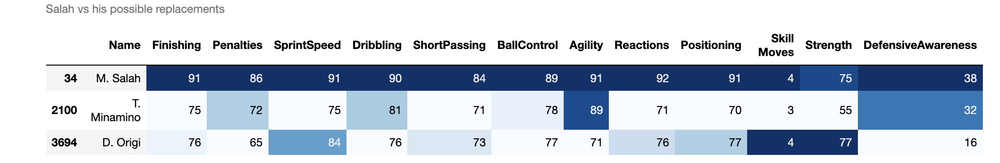

From the table above, It is clear that Salah's row is all blue and domination which means he wins in every attribute. To further visualise this i'm going to use the values from the table above to plot these attributes against each other in a polar plot. A polar chart is one of the most common visualisation in football statsitics and used frequently in the FIFA game too. To plot both graphs on the same chart I'm going to create suplots using plotply and then add trace for each player using fig.add_trace.

In [1365]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# Create the subplot and set its type to polar 
fig = make_subplots(rows=1, cols=3, 
                    specs=[[{'type': 'xy'}, {"type": "polar"}, {'type': 'xy'},]],
                    column_widths=[0.3, 0.7, 0.3])

#Add the chart of Salah using add trace 

fig.add_trace(go.Scatterpolar(
         r=[91, 91, 84, 90, 38, 75, 91],    # Value score of each player for each attributes
         theta=['Pace', 'Finishing', 'Passing', 'Dribbling', 'Defensive Awareness', 'Physical', 'Positioning'],  #attributes to be compared
         fill='toself',
         hovertemplate='<b>%{theta}</b>' + f'<b>: '+'%{r}',
         showlegend=True,   # Show labels 
    name= 'M. Salah' ,
         line=dict(
                   color='Green'
                   )
),
         row=1, col=2)

# Same method to add the chart of Minamino
fig.add_trace(go.Scatterpolar(
         r=[75, 75, 71, 81, 32, 55, 70],
         theta=['Pace', 'Finishing', 'Passing', 'Dribbling', 'Defensive Awareness', 'Physical', 'Positioning'],
         fill='toself',
         hovertemplate='<b>%{theta}</b>' + f'<b>: '+'%{r}',
         showlegend=True,
    name='T. Minamino',
         line=dict(
                   color='Orange'
                   )
),
         row=1, col=2)


fig.update_layout(polar = dict(radialaxis = dict(visible = True)), showlegend = True, title = "Salah vs Minamino Polar Chart")
fig.show()


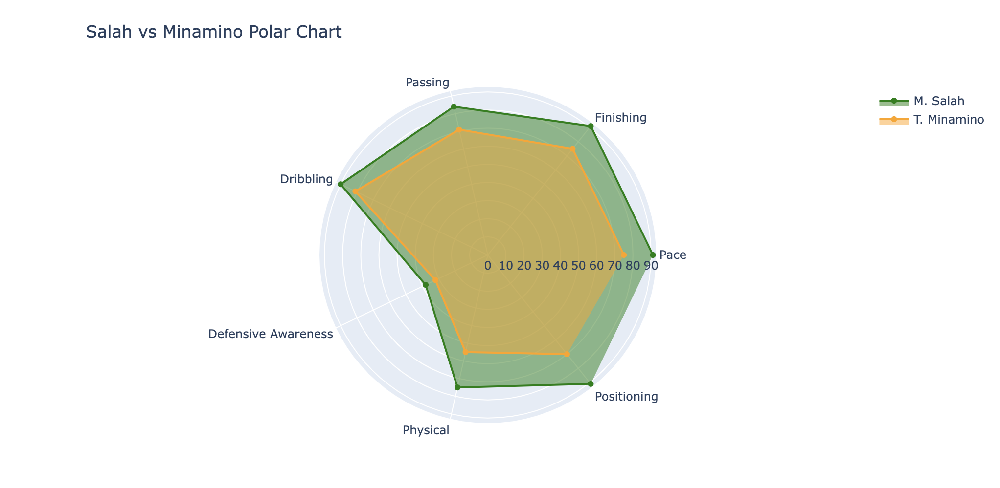

In [1366]:
# Using same method plot polar plot of Origi vs Salah
fig = make_subplots(rows=1, cols=3, 
                    specs=[[{'type': 'xy'}, {"type": "polar"}, {'type': 'xy'},]],
                    column_widths=[0.3, 0.7, 0.3])

fig.add_trace(go.Scatterpolar(
         r=[91, 91, 84, 90, 38, 75, 91],
         theta=['Pace', 'Finishing', 'Passing', 'Dribbling', 'Defensive Awareness', 'Physical', 'Positioning'],
         fill='toself',
         hovertemplate='<b>%{theta}</b>' + f'<b>: '+'%{r}',
         showlegend=True,
    name= 'M. Salah' ,
         line=dict(
                   color='Green'
                   )
),
         row=1, col=2)

fig.add_trace(go.Scatterpolar(
         r=[84, 76, 73, 76, 16, 77, 77],
         theta=['Pace', 'Finishing', 'Passing', 'Dribbling', 'Defensive Awareness', 'Physical', 'Positioning'],
         fill='toself',
         hovertemplate='<b>%{theta}</b>' + f'<b>: '+'%{r}',
         showlegend=True,
    name='D. Origi',
         line=dict(
                   color='Orange'
                   )
),
         row=1, col=2)


fig.update_layout(polar = dict(radialaxis = dict(visible = True)), showlegend = True, title = "Salah vs Origi Polar Chart")
fig.show()

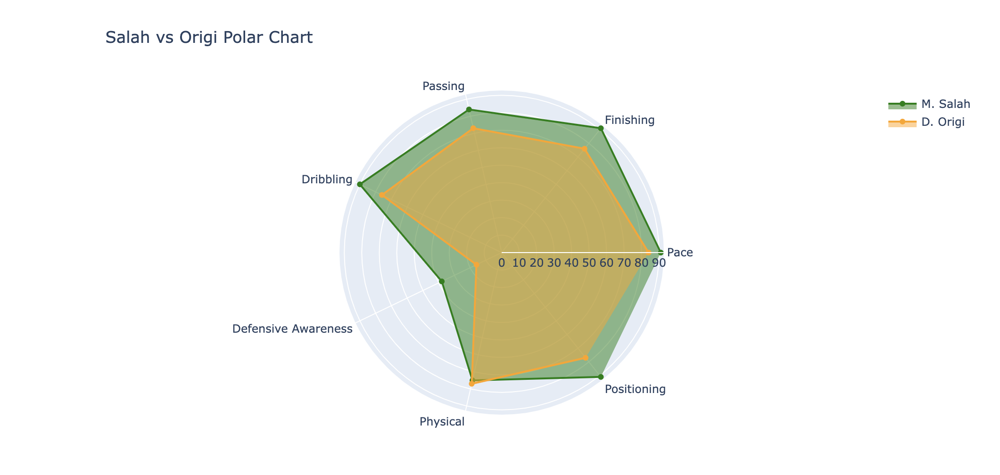

Both charts show complete domination from Salah and that he is levels above both players except the physical aspect against Origi. As shown, the green plot in both charts extends the yellow by a big distance, this reflects the huge difference in quality between Salah and both players, which is not a good indicator and means that Liverpool needs a player with a quality close to Salah, to be able to play for a month in 3 different competetions including a semi-final. So now I will begin the process to find similar players to Salah from other teams by creating a reccomender system and clustering, but first now after the analysis and clarifying the end goal, I'm going to perform further needed analysis and feature engineering before progressing. 

## Further Data Cleaning and Feature Engineering 

To build a reccomender system, I will need a list of variables to compare players with and find similarity. I will create a list of the main attributes that will be analysed, these attributes are the main ones according to the FIFA game statistics website 'SoFifa'(Borjigin, 2022).

In [1367]:
# Create a list of all attributes to be analyzed for similarity
Attributes = ['Foot', 'Weak Foot', 'Skill Moves', 'Penalties','Crossing', 
             'Finishing', 'Reactions', 'HeadingAccuracy', 'ShortPassing', 'Volleys', 'Dribbling',
             'Curve', 'FKAccuracy', 'LongPassing', 'BallControl', 'Acceleration',
             'SprintSpeed', 'Agility', 'Balance', 'ShotPower',
             'Jumping', 'Stamina', 'Strength', 'LongShots', 'Aggression',
             'Interceptions', 'Positioning', 'Vision', 'Penalties', 'Composure',
              'StandingTackle', 'SlidingTackle']

Now there is more cleaning that neededs to be done to help the system become more accurate. I will drop all players that Liverpool can't reallisticly sign either because of value, where they play and any other factor that I know of  Liverpool's transfer strategy. First one, is that they always go for younger players, and as Salah's age is 29 also, I'm going to set my system to find players younger than 29 which I'm going to do by dropping players with age greater than 29. It can be more accurate to lower the age even more also but as Salah will be the independent variable and element of comparison.

In [1368]:
DataFrame = DataFrame.drop(DataFrame[DataFrame.Age > 29].index)

It is always hard in world football to buy players from the club's direct rivals and especially hard in the middle of the season when Liverpool are competing against them, so I'm going to drop all players that play for the 6 main rivals of Liverpool.

In [1369]:
DataFrame = DataFrame[DataFrame.Club != 'Manchester City']
DataFrame = DataFrame[DataFrame.Club != 'Chelsea']
DataFrame = DataFrame[DataFrame.Club != 'Arsenal']
DataFrame = DataFrame[DataFrame.Club != 'Manchester United']
DataFrame = DataFrame[DataFrame.Club != 'Tottenham Hotspur']
DataFrame = DataFrame[DataFrame.Club != 'Everton']

One of the main factors that will come into decsion is the players contracts as it can determine how hard or easy it is to terminate his contract.Now using seaborn I'm going to plot the relationship between contract duration and value of player to observe their relationship as it is expected the longer the player's contract the higher his transfer value will be

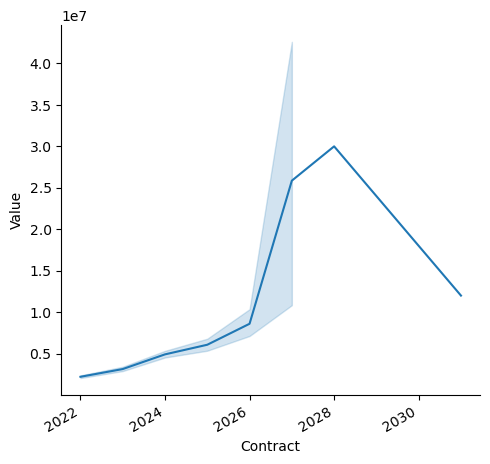

In [1370]:
g = sns.relplot(x="Contract", y="Value", kind="line", data=DataFrame)
g.figure.autofmt_xdate()

From this graph we can see that when the contract's expiry is after 2026 there is a very sharp increase in the player's value. And it is harder for a player with longer contract to persuade to join Liverpool to be Salah's alternative as they will want to play reguraly for the rest of the season. That's why I'm going to drop players with contracts running till 2026 or longer.

In [1371]:
DataFrame = DataFrame.drop(DataFrame[DataFrame.Contract > 2026].index)

Now after considering the value of players, Liverpool always have a controlled transfer budget and as they will be signing a backup player it makes sense that the player doesn't cost more Salah. So I'm going to drop all players with higher transfer value than Salah which is £101M. As mentioned before I can't reduce the value more than that because that will also drop Salah from the dataset. 

In [1372]:
DataFrame = DataFrame.drop(DataFrame[DataFrame.Value > 102000000].index)

In any industry or buissness it is also known that the cheaper the product, the lower the quality. This applies to players too. As Liverpool have very high standards and play at the highest levels, they need high quality players, so to ensure that dropping high value players from the dataframe doesn't lead to weak results, I'm going to analyse anotehr variable that indicates the player's value, which is wages. I'm going to plot the relationship between player's wage and overall to validate this point.

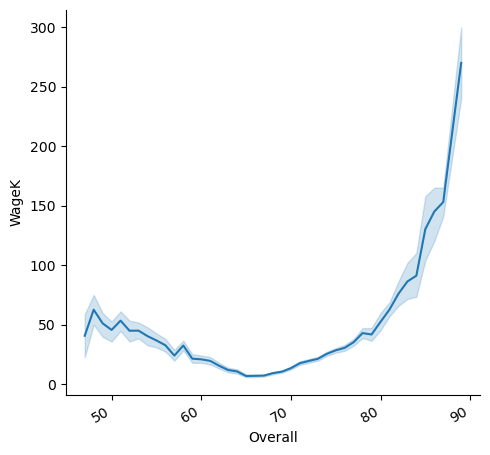

In [1373]:
g = sns.relplot(x="Overall", y="WageK", kind="line", data=DataFrame)
g.figure.autofmt_xdate()

From this graph it is obvious that the higher the player's wage the higher their overall and that players with wages less than around £50K, have overalls less than 80 which is the same category that players like Origi and Minamino falls in, whom I compared to Salah before. Thus, I'm going to drop players with wages less than £50K.

In [1374]:
DataFrame = DataFrame.drop(DataFrame[DataFrame.WageK < 50].index)

The motive of this project is that Liverpool are losing players to the african cup. So a very important variable that needs to be checked is the nationlaity, as we need to elimnate all african players from the reccomnder system as they will not be available to play like Salah. But to check if this needed, I will plot a bar plot to visualise the the most common nationalities of all players.

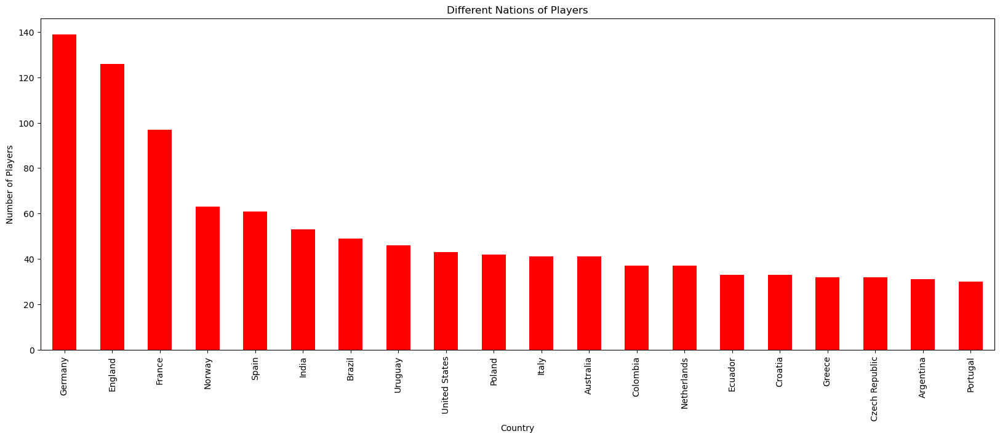

In [1375]:
DataFrame['Nationality'].value_counts().head(20).plot.bar(color = 'red', figsize = (20, 7))
plt.title('Different Nations of Players')
plt.xlabel('Country')
plt.ylabel('Number of Players')
plt.show()

We can observe from the plot above there are no african countries visible in the most common 20 nations which means that the chance of finding an african player is very low. Thus I took the decision to not  drop any african players for wider analysis and also as it would be a lengthy function to drop every african country. 

Now I will check the details and information about the dataset after all the cleaning and now the dataset is ready to find similar players to Salah.

In [1376]:
DataFrame.shape

(1606, 48)

In the intoruction I mentioned that working with 16710 players and 65 variables is very hard, so now after all the cleaning and feature extraction the dataset closed down to 1606 players only and 48 variables.

In [1377]:
DataFrame.describe()

,ID,Age,Overall,Potential,Value,WageK,Weak Foot,Skill Moves,Contract,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,Best Overall Rating,DefensiveAwareness,Foot
count,1606,1606,1606,1606,2e+03,1606,2e+03,2e+03,1606,1606,1606,1606,1606,1606,1606,1606,1606,1606,1606,1606,1606,1606,1606,1606,1606,1606,1606,1606,1606,1606,1606,1606,1606,1606,1606,1,1606,1606,1606,1605,2e+03
mean,244821,22,65,74,6e+06,66,3e+00,3e+00,2023,52,49,54,61,45,60,50,44,54,62,71,70,67,60,68,57,64,65,62,49,56,48,54,54,50,58,21,50,48,66,48,3e-01
std,19164,4,9,6,1e+07,23,7e-01,7e-01,1,15,17,13,12,15,14,16,15,14,12,10,9,12,11,11,15,11,12,13,17,15,20,16,14,13,12,NaN,19,19,9,18,4e-01
min,159949,16,47,51,6e+04,50,1e+00,2e+00,2022,19,15,23,28,12,16,19,16,20,27,30,30,29,32,28,21,30,30,28,14,20,10,14,19,20,32,21,10,10,48,10,0e+00
25%,233203,18,58,70,4e+05,50,3e+00,2e+00,2022,41,35,45,53,33,53,38,32,44,55,65,65,60,52,61,47,58,57,53,35,45,29,45,45,40,48,21,33,31,59,33,0e+00
50%,252594,21,62,74,8e+05,57,3e+00,2e+00,2023,52,51,53,61,43,61,48,40,55,62,70,70,68,57,69,56,65,65,63,49,55,52,55,54,49,56,21,55,52,64,51,0e+00
75%,260100,25,71,79,3e+06,79,3e+00,3e+00,2024,62,61,62,69,55,69,60,53,64,70,77,77,75,68,76,66,72,73,72,60,66,61,64,64,59,67,21,65,62,72,61,1e+00
max,264704,29,89,91,1e+08,310,5e+00,5e+00,2026,91,91,92,92,88,92,92,92,90,93,97,96,94,92,94,90,93,95,94,89,91,90,91,92,90,94,21,92,90,89,92,1e+00


## Finding Players Similar to Salah

### 1- KNN (K Nearest Neighbours)

First method I'm going to use is finding similarity using KNN using the list of attributes I created earlier. Nearest Neighbours in a non parametric classification method from Sklearn library. The KNN algorithm assumes that similar variables exist close to each other. It is a supervised method that gives a value of similarity and can be used to rank the results based on the distance between each point (or player in our case) to each other. (Harrison, 2022)

So now as I have the attributes, through content based filtering, I'm going to create a reccomender system that finds 10 players using the attributes to calculate the distance between Salah and other players and add the distance and the index to sort the players. Then get the names of the selected number of players or K entries. I expect this method to be the most convenient one.

In [1384]:
# Import sklearn library 
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors

Create a dataframe with ID and name because they are going to be dropped and recalled later to leave only numerical attributes:

In [1379]:
tr = DataFrame[['ID','Name']+ Attributes].dropna()
id_name = DataFrame[['Name','ID']].set_index('ID')['Name'].to_dict()

To obtain the closest matches for any given player, I decided to use a Nearest Neighbors model, which will calculate the distance of each point in vector space from every other point. This approach is commonly used for clustering and classification algorithms like k-means, but we’ll just be using the intermediate distance calculations for each point to get it’s three nearest matches.

In [1380]:
NUM_RECOM = 10  #How many players to be reccomend
#normalize and scale the features
scaled = StandardScaler() 
X = scaled.fit_transform(tr[Attributes].dropna().values) 
# fit the model
recommendations = NearestNeighbors(n_neighbors=NUM_RECOM+1, algorithm='ball_tree')
recommendations.fit(X)


# rank the recommendations
dist, rank = recommendations.kneighbors(X)


# Pass player ID from dataframe to the function
similar_df = pd.DataFrame(columns=[f'rank_{i}'for i in range(1,NUM_RECOM+1)],
                          index=tr['ID'].values,
                          data=rank[:,1:])
dist_df = pd.DataFrame(columns=[f'rank_{i}'for i in range(1,NUM_RECOM+1)],
                       index=tr['ID'].values,
                       data=dist[:,1:])


for cols in list(similar_df):
    tg_col = similar_df[cols]
    new_value = tr['ID'].iloc[tg_col].tolist()
    similar_df[cols] = new_value

Now I'm going to create a barc chart and table display to visualise the results with all other variables not included in the attributes like club, value, wages and foot as mentioned in the introduction:

In [1381]:
# Define the function that will find simialr using player's ID

def similar_player(similar_df, dist_df, player_id):
    player_id = int(player_id)
    player_name = tr[tr['ID'] == player_id]['Name'].values[0]
    
    ## Create the Bar chart
    Xaxis = 1/(1+dist_df.loc[player_id].values[::-1])
    Yaxis = similar_df.loc[player_id].map(id_name).values[::-1]

    fig = go.Figure(go.Bar(
                x=Xaxis,
                y=Yaxis,
                orientation='h'))
    
    fig.update_layout(title_text='Players similar to  " '+str(player_name)+' "')
    fig.show()
    
    # Create the Table display 
    sim_ply = similar_df.loc[player_id]
    display_columns = ['Name','Age', 'Position','Nationality','Overall', 'Club', 'Preferred Foot','Weak Foot', 'Contract',
                'WageK','Value']
    display_df = pd.DataFrame({'ID':similar_df.loc[player_id]})\
    .merge(DataFrame[['ID']+display_columns], how='left', on='ID')[display_columns]

    display(display_df.style.highlight_max(color='lightgreen').highlight_min(color='#cd4f39'))

Now as the player's ID will be the independant variable, I'm going to create a function that finds a player's ID to find his similar players , in this case Salah:

In [1382]:
#Find Salah ID
def ID(x):
    return DataFrame[DataFrame['Name'] == x][['Name','ID']]

ID ('M. Salah')

,Name,ID
34,M. Salah,209331


In [1383]:
similar_player(similar_df, dist_df, 209331)

,Name,Age,Position,Nationality,Overall,Club,Preferred Foot,Weak Foot,Contract,WageK,Value
0,P. Dybala,27,2,Argentina,87,Juventus,Left,3,2022,160,93000000
1,Oyarzabal,24,3,Spain,85,Real Sociedad,Left,3,2024,57,77500000
2,Raphinha,24,3,Brazil,82,Leeds United,Left,4,2024,89,46000000
3,F. Thauvin,28,3,France,80,Tigres U.A.N.L.,Left,3,2025,64,21000000
4,Y. Carrasco,27,3,Belgium,84,Atlético de Madrid,Right,4,2024,81,45000000
5,D. Berardi,26,3,Italy,82,U.S. Sassuolo Calcio,Left,3,2024,51,33500000
6,20 Gabriel Barbosa,22,3,Brazil,81,Inter,Left,3,2024,71,23500000
7,Anderson Talisca,27,2,Brazil,82,Al Nassr,Left,4,2024,61,35500000
8,L. Sané,25,3,Germany,84,FC Bayern München,Left,2,2025,105,56000000
9,T. Lemar,25,2,France,83,Atlético de Madrid,Left,3,2023,71,48000000


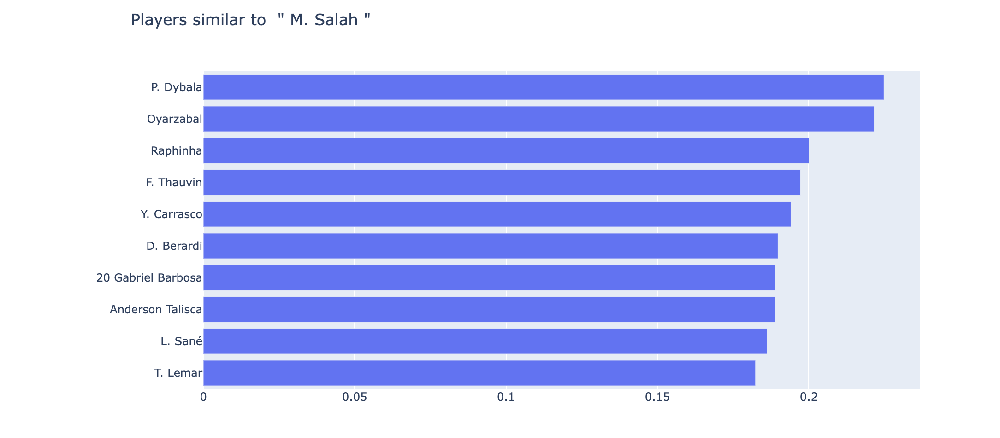

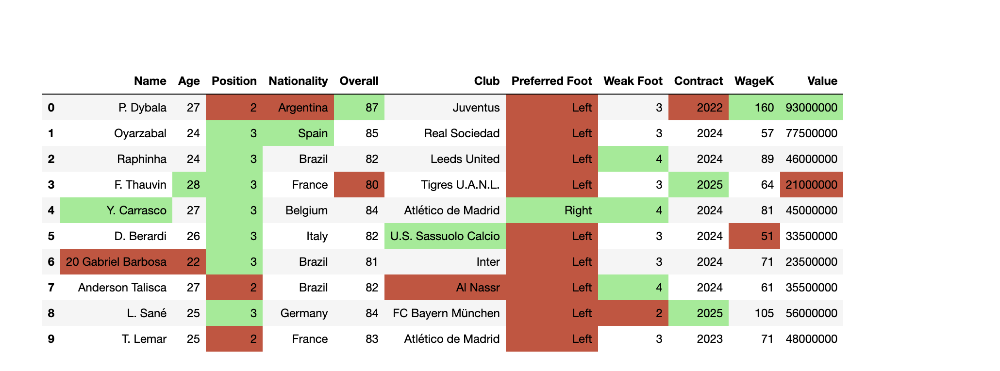

The reccomender system succeceded to find players with postions, values and abilities as desired. But there is no clear way to evaluate the credibility of the model as it has no perforemance metrics that it can be comapared to, but the validity of results can be checked in comparison with other solutions later in the report and real life analysis done by clubs and football magazines.

According to ESPN one of the biggest and most credible sports news channels in the world, ESPN listed these players as sources say Liverpool are actually interested in and also have very good statistics that are similar to salah and match Liverpool's style of play like defensive challenges per match, dribbles, chances created and shots per game. 

The list came short to 5 players who are ranked in order of who is the best fit :

    1- Raphinha 
    2- Mikel Oyarzabal 
    3- Jarrod Bowen
    4- Antony 
    5- Joao Felix 

(Karlsen, 2022)

As observed in the charts above and the reccomender system results that 2 out of the 5 players that ESPN founded, my recomender system found, Raphinha and Oyarzabal, who happen to be the first and second on ESPN's list and second and third on my list. This means that my reccomender system was around 66.7% correct in finding top 3 players to replace Salah in comparison with ESPN's findings. 

This is very good if taken into consideration that this my system works with FIFA Dataset which is not very detailed and are actually a summary of the big data ESPN worked with which might give them better results. Also ESPN based their analysis on players their sources know that Liverpool wants, so their results can be prone to false news, but the top 2 players on their list were found by the KNN model above also. 

### 2- K Means Clustering

Second method I'm going to use is the K means clustering. This method will split the players into the number of clusters I decide and players will be assigned to their closest cluster. It is an unsupervised algorthim unlike the K nearest neighbours which means that it will need further cleaning of the dataset to help find better results. 

I will use the k-means function and assign a model to it to fit and then I can assess the players in the same cluster as Salah:

I will drop players with overall less than 76 which is the overall of Origi and Minamino whom I compared to Salah earlier. This is to reduce the dataset for better clustering.

In [1413]:
DataFrame = DataFrame.drop(DataFrame[DataFrame.Overall < 76].index)

Now I will create a new dataframe of the same attributes I listed before to cluster:

In [1414]:
df = DataFrame[['Foot', 'Weak Foot', 'Skill Moves', 'Penalties','Crossing', 
             'Finishing', 'Reactions', 'HeadingAccuracy', 'ShortPassing', 'Volleys', 'Dribbling',
             'Curve', 'FKAccuracy', 'LongPassing', 'BallControl', 'Acceleration',
             'SprintSpeed', 'Agility', 'Balance', 'ShotPower',
             'Jumping', 'Stamina', 'Strength', 'LongShots', 'Aggression',
             'Interceptions', 'Positioning', 'Vision', 'Penalties', 'Composure',
              'StandingTackle', 'SlidingTackle']]

First I will scale and normalise the features as I've done in the KNN model:

In [1415]:
from sklearn import preprocessing
x = df.values # numpy array
scaler = preprocessing.MinMaxScaler()
x_scaled = scaler.fit_transform(x)
X_norm = pd.DataFrame(x_scaled)

I will use PCA to specify 2 components only for a 2d plot that will visualise the location of each cluster:

In [1416]:
from sklearn.decomposition import PCA
pca = PCA(n_components = 2) # 2D PCA for the plot
reduced = pd.DataFrame(pca.fit_transform(X_norm))

Now I will use K means to create 8 clusters to allow a better classification and find better similar players as this is an unspervised algorithm. Then I will fit the the model and assign the labels like it was done in the KNN method:

In [1417]:
from sklearn.cluster import KMeans
# specify the number of clusters
kmeans = KMeans(n_clusters=8, init='random', random_state=0)

# fit the input data
kmeans = kmeans.fit(reduced)
# get the cluster labels
name= DataFrame.Name.tolist()
labels = kmeans.predict(reduced)
# centroid values
centroid = kmeans.cluster_centers_
# cluster values
clusters = kmeans.labels_.tolist()

Now I will print the dataframe with clusters to check if the model is created:

In [1419]:
reduced['cluster'] = clusters
reduced['names'] = names
reduced.columns = ['x','y','cluster','names']
reduced.head()

,x,y,cluster,names
0,-7e-02,4e-01,4,L. Goretzka
1,2e-01,3e-01,5,E. Can
2,-2e-01,1e+00,7,D. Alaba
3,-2e-01,4e-01,4,N. Barella
4,-5e-01,2e-01,4,M. Sabitzer


Using seaborn I'm going to plot the 8 clusters to visualise them and spot Salah and players close to him:

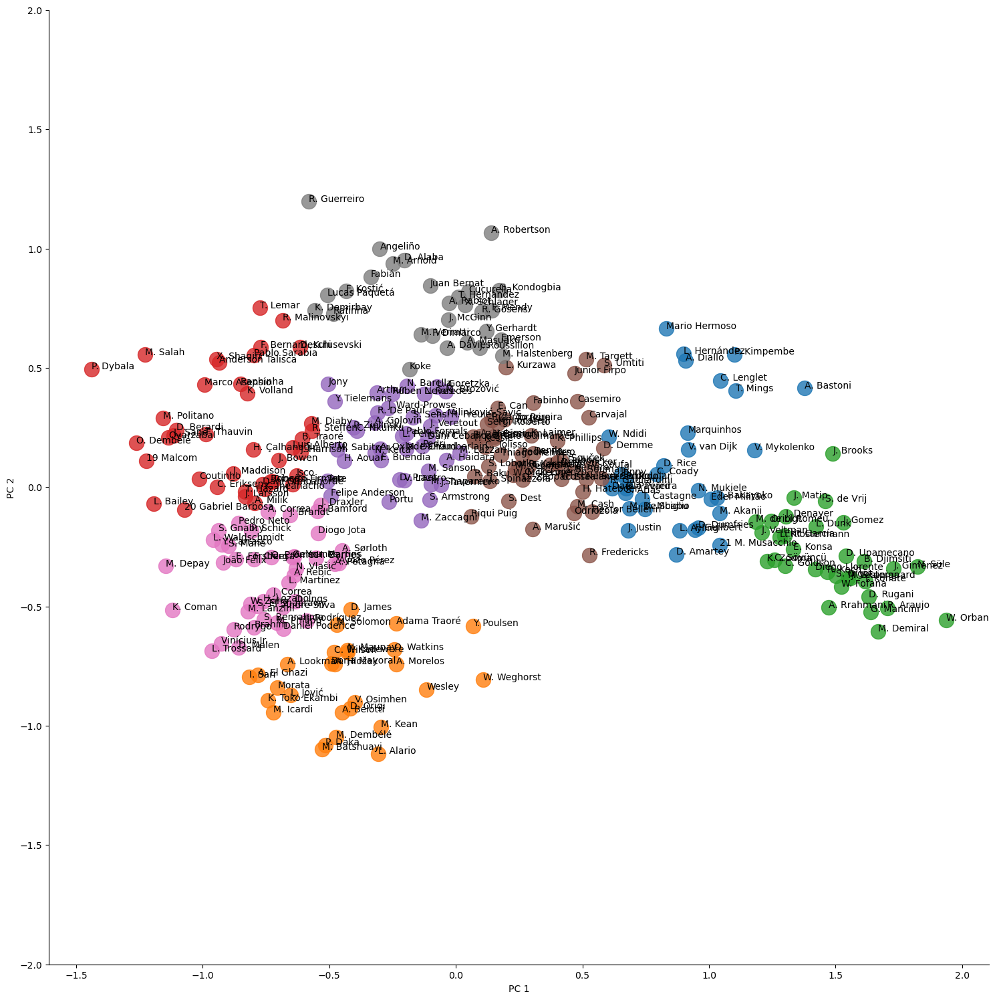

In [1420]:
ax = sns.lmplot(x="x", y="y", hue='cluster', data = reduced, legend=False,
fit_reg=False, size = 15, scatter_kws={"s": 250})
texts = []
for x, y, s in zip(reduced.x, reduced.y, names):
    texts.append(plt.text(x, y, s))
    ax.set(ylim=(-2, 2))
plt.tick_params(labelsize=10)  # I tried to decrease the font size for more names to appear 
plt.xlabel("PC 1")
plt.ylabel("PC 2")
plt.show()

From the plot, it appears that the model succeded to cluster the players into specific categroies. There are defenders in green, defensive midfielders in blue. Less forward wingers are orange and poacher forwards and midfielders in pink, where Salah is. Salah's closest visable player is Dybala which gives a great sign that results are similar to the KNN model. Other players close to Salah aren't really visibile to I'm going to print the data of players in Salah's cluster:

In [1421]:
# Find Salah's Cluster
def Cluster(x):
    return DataFrame[DataFrame['Name'] == x][['Name','Cluster']]

Cluster ('M. Salah')

,Name,Cluster
34,M. Salah,1


In [1422]:
DataFrame[DataFrame['Cluster'] == 1].head(10)

,ID,Name,Age,Nationality,Overall,Potential,Club,Value,WageK,Preferred Foot,Weak Foot,Skill Moves,Contract,Height,Weight,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,Position,Best Overall Rating,DefensiveAwareness,Foot,Cluster
34,209331,M. Salah,29,Egypt,89,89,Liverpool,101000000,270,Left,3,4,2023,175cm,71kg,79,91,59,84,81,90,83,69,75,89,89,91,91,92,91,82,69,85,75,84,63,55,91,83,86,90,NaN,43,41,3,89,38,1,1
55,208722,S. Mané,29,Senegal,89,89,Liverpool,101000000,270,Right,4,4,2023,175cm,69kg,78,86,84,84,75,90,77,64,71,88,93,90,93,91,88,83,87,85,72,80,75,35,90,84,71,84,NaN,42,38,3,89,42,0,1
90,212523,Anderson Talisca,27,Brazil,82,83,Al Nassr,35500000,61,Left,4,4,2024,190cm,80kg,75,81,77,84,76,83,86,87,82,84,84,76,87,78,75,84,65,82,75,87,67,52,86,79,75,77,NaN,55,42,2,84,45,1,1
119,224458,Diogo Jota,24,Portugal,82,87,Liverpool,46000000,120,Right,5,4,2025,178cm,73kg,71,84,77,75,78,85,77,58,71,85,88,81,87,84,86,84,76,81,71,75,85,56,85,75,63,83,NaN,57,45,3,84,54,0,1
156,211110,P. Dybala,27,Argentina,87,88,Juventus,93000000,160,Left,3,4,2022,177cm,75kg,82,85,59,87,88,90,90,88,79,93,88,80,92,80,94,84,75,70,61,89,43,42,82,91,84,79,NaN,41,39,2,89,32,1,1
173,214997,A. Correa,26,Argentina,83,86,Atlético de Madrid,48000000,80,Right,4,4,2024,171cm,70kg,75,85,69,82,80,88,82,65,66,87,86,85,90,84,87,83,49,82,71,86,79,48,84,84,55,76,NaN,53,44,2,86,42,0,1
261,233419,Raphinha,24,Brazil,82,87,Leeds United,46000000,89,Left,4,4,2024,176cm,68kg,78,74,45,76,72,86,81,75,70,83,90,91,88,82,79,81,74,84,64,76,76,55,81,77,73,78,NaN,54,38,3,83,45,1,1
305,203486,T. Hazard,28,Belgium,82,82,Borussia Dortmund,30500000,75,Right,4,4,2024,175cm,71kg,81,74,42,82,77,85,82,81,72,84,84,76,91,81,88,77,60,78,65,76,57,63,80,82,79,78,NaN,47,49,3,82,58,0,1
306,220697,J. Maddison,24,England,82,85,Leicester City,41500000,100,Right,4,4,2024,175cm,73kg,81,75,35,84,70,84,85,84,82,86,78,72,86,76,83,83,54,74,51,80,68,44,80,87,74,84,NaN,65,42,2,84,59,0,1
307,208418,Y. Carrasco,27,Belgium,84,84,Atlético de Madrid,45000000,81,Right,4,4,2024,185cm,73kg,81,81,53,79,70,88,81,79,73,85,89,88,87,80,73,85,71,80,61,82,65,43,80,77,81,79,NaN,47,35,3,84,44,0,1


Although it was unspervised, results seem reliable as it makes sense that the most similar players to Salah are the forwards that play with him in the same team like Mane and Jota. There are also few similarities with KNN results. Players like Carrasco, Talisca, Dybala and Raphinha are visible in both models. This means that this model is similar with 40% to the KNN model, as it found 4 similar players out of 10 the neighrest neighbours model found. This is expected as the clustering doesn't rank the similarity as it is an unspervised method, which makes the neigherest neighbour more reliable.

## Evaluation

Both KNN and Kmeans produced reasonable results within the context of the problem and the dataset analysed. Both needed deep cleaning before, but K-means needed even more as it can't handle data as big as the FIFA one. It makes sense as KNN calculates feature similarity, a classification technique and K means divides objects into clusters. This makes the later not really suitable for such a problem but it still provided an insight after all the cleaning, and when the number of clusters were high. (Saxena, 2022)

Another thing the KNN model beats K-means in is the ranking of results. As K-means don't have a coefficient of similarity, it only calculates distance between players and each other, which in case can't be compared with a variable like Salah and various vectors. Finding a similar player is a challenging problem that doesn't have a plenty of solutions, and K nearest neighbours is basically the most reliable if not the only model to depend on in usch problems. 

However, to reach my final solution, I'm not going to totally depend on the KNN model. Now that I have 2 methods that produced 4 similar results, I can reach more reliable results to actually find the player to replace Salah. So I'm going to create a dataframe with these 4 similar players and analyse them to decide on a final player

## Final Solution

In [1424]:
df2 = DataFrame[(DataFrame.Name == 'Raphinha') | 
                         (DataFrame.Name == 'P. Dybala') | 
                         (DataFrame.Name == 'Anderson Talisca') |
                         (DataFrame.Name == 'Y. Carrasco') 
                         ]
df2.head()

,ID,Name,Age,Nationality,Overall,Potential,Club,Value,WageK,Preferred Foot,Weak Foot,Skill Moves,Contract,Height,Weight,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,Position,Best Overall Rating,DefensiveAwareness,Foot,Cluster
90,212523,Anderson Talisca,27,Brazil,82,83,Al Nassr,35500000,61,Left,4,4,2024,190cm,80kg,75,81,77,84,76,83,86,87,82,84,84,76,87,78,75,84,65,82,75,87,67,52,86,79,75,77,NaN,55,42,2,84,45,1,1
156,211110,P. Dybala,27,Argentina,87,88,Juventus,93000000,160,Left,3,4,2022,177cm,75kg,82,85,59,87,88,90,90,88,79,93,88,80,92,80,94,84,75,70,61,89,43,42,82,91,84,79,NaN,41,39,2,89,32,1,1
261,233419,Raphinha,24,Brazil,82,87,Leeds United,46000000,89,Left,4,4,2024,176cm,68kg,78,74,45,76,72,86,81,75,70,83,90,91,88,82,79,81,74,84,64,76,76,55,81,77,73,78,NaN,54,38,3,83,45,1,1
307,208418,Y. Carrasco,27,Belgium,84,84,Atlético de Madrid,45000000,81,Right,4,4,2024,185cm,73kg,81,81,53,79,70,88,81,79,73,85,89,88,87,80,73,85,71,80,61,82,65,43,80,77,81,79,NaN,47,35,3,84,44,0,1


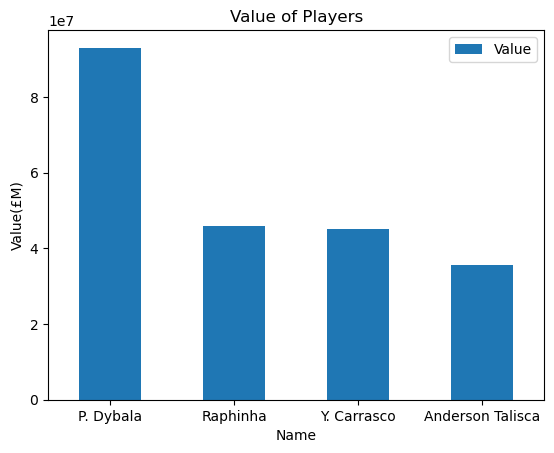

In [1426]:
df2_sorted= df2.sort_values('Value',ascending=False)
ax = df2_sorted.plot.bar(x='Name', y='Value', rot=0)
plt.title('Value of Players')
plt.xlabel('Name')
plt.ylabel('Value(£M)')
plt.show()

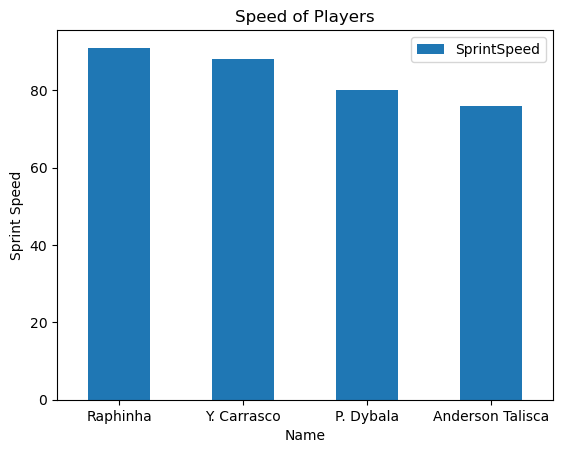

In [1427]:
df2_sorted_pace= df2.sort_values('SprintSpeed',ascending=False)
ax = df2_sorted_pace.plot.bar(x='Name', y='SprintSpeed', rot=0)
plt.title('Speed of Players')
plt.xlabel('Name')
plt.ylabel('Sprint Speed')
plt.show()

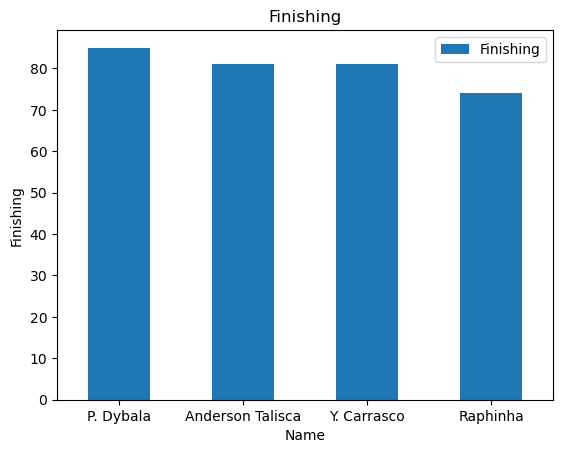

In [1428]:
df2_sorted= df2.sort_values('Finishing',ascending=False)
ax = df2_sorted.plot.bar(x='Name', y='Finishing', rot=0)
plt.title('Finishing')
plt.xlabel('Name')
plt.ylabel('Finishing')
plt.show()

I will also assess reactions, as one of the main findings of the project is how it is highly correlated with player's ability

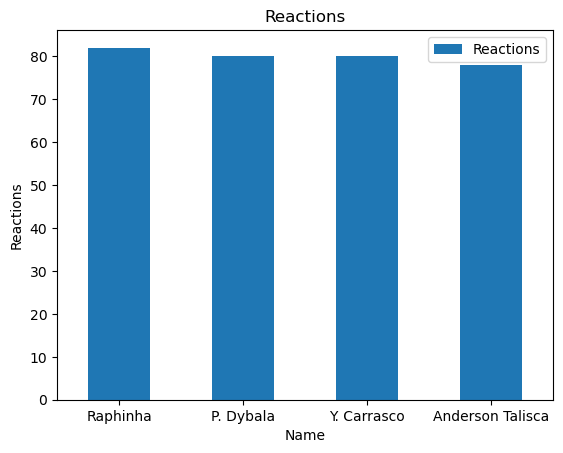

In [1429]:
df2_sorted= df2.sort_values('Reactions',ascending=False)
ax = df2_sorted.plot.bar(x='Name', y='Reactions', rot=0)
plt.title('Reactions')
plt.xlabel('Name')
plt.ylabel('Reactions')
plt.show()

Now I will create a plotly interactive table again to compare these 4 players so I will drop the not needed columns:

In [1430]:
df2.drop(['ID','Nationality','Height','Weight','Marking'],axis=1, inplace = True )

In [1431]:

# Formatted table output
df2.style\
          .set_caption('''Salah vs his possible replacements''')\
          .set_table_styles([{'selector': 'tr:hover','props': [('background-color', '#0080ff')]}])\
          .set_precision(0)\
          .background_gradient(cmap='Blues')

,Name,Age,Overall,Potential,Club,Value,WageK,Preferred Foot,Weak Foot,Skill Moves,Contract,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,StandingTackle,SlidingTackle,Position,Best Overall Rating,DefensiveAwareness,Foot,Cluster
90,Anderson Talisca,27,82,83,Al Nassr,35500000,61,Left,4,4,2024,75,81,77,84,76,83,86,87,82,84,84,76,87,78,75,84,65,82,75,87,67,52,86,79,75,77,55,42,2,84,45,1,1
156,P. Dybala,27,87,88,Juventus,93000000,160,Left,3,4,2022,82,85,59,87,88,90,90,88,79,93,88,80,92,80,94,84,75,70,61,89,43,42,82,91,84,79,41,39,2,89,32,1,1
261,Raphinha,24,82,87,Leeds United,46000000,89,Left,4,4,2024,78,74,45,76,72,86,81,75,70,83,90,91,88,82,79,81,74,84,64,76,76,55,81,77,73,78,54,38,3,83,45,1,1
307,Y. Carrasco,27,84,84,Atlético de Madrid,45000000,81,Right,4,4,2024,81,81,53,79,70,88,81,79,73,85,89,88,87,80,73,85,71,80,61,82,65,43,80,77,81,79,47,35,3,84,44,0,1


From the stats above we can see that from the group of players Raphinha is the youngest, has the most growth to potential, as highlighted in dark blue he is the best player in Speed, Tackling and Stamina which are required in a team like Liverpool that is very quick and physical, in addition to being low cost which will make it easier to buy him. So in conclusion through this dataset, clustering and similarity classification, Raphinhia is the ideal player to replace Salah at Liverpool. 

Although there can be systematic errors due to the fact that FIFA ratings are not necessarily correct about real life, I excluded all these erorrs by deep cleaning, precise feature engineering and even using results from 2 different models to find the prefect match. This led that the project succeeded in finding a player that can suit real life analyis as the most credible source in football, 'The Athletic' announced a few days ago that Raphinhia is Liverpool's number one target.

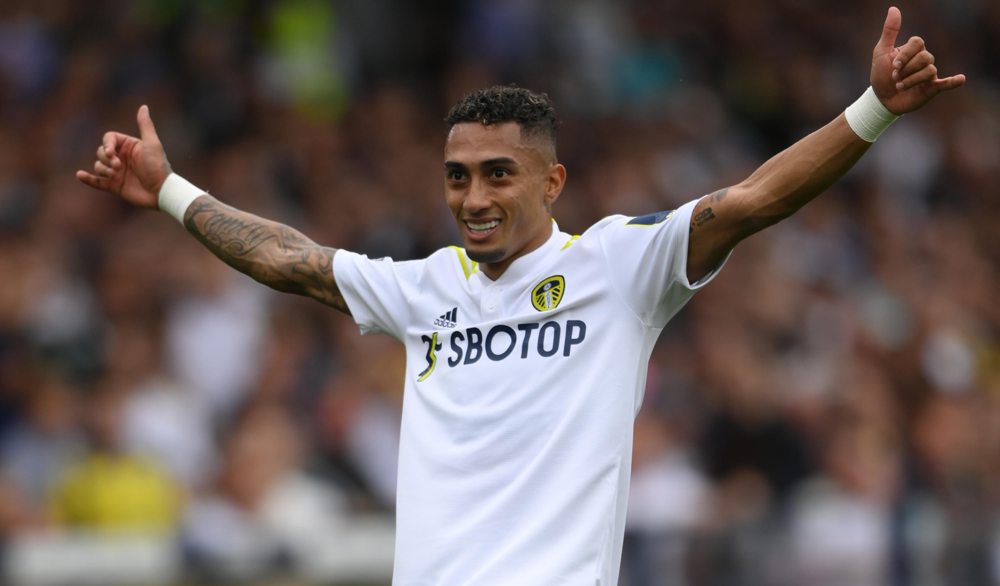

## Resources

1- Karlsen, T., 2022. Who could replace Salah if he leaves Liverpool?. [online] ESPN.com. Available at: <https://www.espn.com/soccer/liverpool-engliverpool/story/4594934/liverpool-could-lose-mohamed-salahso-who-could-replace-him-raphinhajarrod-bowenjoao-felix> [Accessed 19 February 2022].

2- Borjigin, K., 2022. Mohamed Salah FIFA 22 Feb 18, 2022 SoFIFA. [online] Sofifa.com. Available at: <https://sofifa.com/player/209331/mohamed-salah/> [Accessed 21 February 2022].

3- Harrison, O., 2022. Machine Learning Basics with the K-Nearest Neighbors Algorithm. [online] Towards Data Science. Available at: <https://towardsdatascience.com/machine-learning-basics-with-the-k-nearest-neighbors-algorithm-6a6e71d01761> [Accessed 21 February 2022].

4- Saxena, P., 2022. KNN and Kmeans. [online] Medium. Available at: <https://harshkr21august.medium.com/knn-and-kmeans-b741dfccb69#:~:text=K%2Dmeans%20is%20an%20unsupervised,for%20classification%20and%20regression%20problem.&text=K%2Dnearest%20neighbors%20algorithm%20(k,for%20classification%20and%20regression%20problems.> [Accessed 21 February 2022].

5- Lee, J., 2022. Grouping Soccer Players with Similar Skillsets in FIFA 20 | Part 1: K-Means Clustering. [online] Medium. Available at: <https://towardsdatascience.com/grouping-soccer-players-with-similar-skillsets-in-fifa-20-part-1-k-means-clustering-c4a845db78bc> [Accessed 21 February 2022].

# Similar Projects Found

1- https://www.kaggle.com/kyeongyeji/term-project-data-visualization-of-fifa-players

2- https://www.kaggle.com/ekrembayar/fifa-data-analysis-visualization

3- https://inblog.in/Analyzing-Fifa-Dataset-Using-Python-KHEOoPIkNn

4- https://www.kaggle.com/jaseziv83/clustering-to-help-club-managers/report

5- https://fcpython.com/machine-learning/introduction-to-k-means-with-python-clustering-shot-creators-in-the-premier-league

6- https://www.kaggle.com/pabloherber/finding-similar-players/notebook
